In [28]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/air-quality-and-pollution-assessment/updated_pollution_dataset.csv


# Libraries

In [29]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Data Upload

In [30]:
df=pd.read_csv('/kaggle/input/air-quality-and-pollution-assessment/updated_pollution_dataset.csv').dropna()

In [31]:
df.head(3)

,Temperature,Humidity,PM2.5,PM10,NO2,SO2,CO,Proximity_to_Industrial_Areas,Population_Density,Air Quality
0,29.8,59.1,5.2,17.9,18.9,9.2,1.72,6.3,319,Moderate
1,28.3,75.6,2.3,12.2,30.8,9.7,1.64,6.0,611,Moderate
2,23.1,74.7,26.7,33.8,24.4,12.6,1.63,5.2,619,Moderate


# Data Preprocessing 

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float64
 1   Humidity                       5000 non-null   float64
 2   PM2.5                          5000 non-null   float64
 3   PM10                           5000 non-null   float64
 4   NO2                            5000 non-null   float64
 5   SO2                            5000 non-null   float64
 6   CO                             5000 non-null   float64
 7   Proximity_to_Industrial_Areas  5000 non-null   float64
 8   Population_Density             5000 non-null   int64  
 9   Air Quality                    5000 non-null   object 
dtypes: float64(8), int64(1), object(1)
memory usage: 390.8+ KB


In [33]:
df['Air Quality'].unique() 


array(['Moderate', 'Good', 'Hazardous', 'Poor'], dtype=object)

# ENCODING

In [34]:
custom_mapping = {'Hazardous': 0, 'Poor': 1, 'Moderate': 2, 'Good': 3}

df['Air Quality'] = df['Air Quality'].map(custom_mapping)

print("Updated DataFrame:")
print(df)

Updated DataFrame:
      Temperature  Humidity  PM2.5   PM10   NO2   SO2    CO  \
0            29.8      59.1    5.2   17.9  18.9   9.2  1.72   
1            28.3      75.6    2.3   12.2  30.8   9.7  1.64   
2            23.1      74.7   26.7   33.8  24.4  12.6  1.63   
3            27.1      39.1    6.1    6.3  13.5   5.3  1.15   
4            26.5      70.7    6.9   16.0  21.9   5.6  1.01   
...           ...       ...    ...    ...   ...   ...   ...   
4995         40.6      74.1  116.0  126.7  45.5  25.7  2.11   
4996         28.1      96.9    6.9   25.0  25.3  10.8  1.54   
4997         25.9      78.2   14.2   22.1  34.8   7.8  1.63   
4998         25.3      44.4   21.4   29.0  23.7   5.7  0.89   
4999         24.1      77.9   81.7   94.3  23.2  10.5  1.38   

      Proximity_to_Industrial_Areas  Population_Density  Air Quality  
0                               6.3                 319            2  
1                               6.0                 611            2  
2          

In [35]:
#Hazardous -> 0
#Poor -> 1
#Moderate -> 2
#Good -> 3


In [36]:
df.head(3)

,Temperature,Humidity,PM2.5,PM10,NO2,SO2,CO,Proximity_to_Industrial_Areas,Population_Density,Air Quality
0,29.8,59.1,5.2,17.9,18.9,9.2,1.72,6.3,319,2
1,28.3,75.6,2.3,12.2,30.8,9.7,1.64,6.0,611,2
2,23.1,74.7,26.7,33.8,24.4,12.6,1.63,5.2,619,2


# EDA

In [37]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

unique_counts = {col: df[col].nunique() for col in df.columns}

unique_counts_df = pd.DataFrame(list(unique_counts.items()), columns=["Column", "Unique Values"])
unique_counts_df.sort_values(by="Unique Values", ascending=False, inplace=True)

fig = go.Figure()

fig.add_trace(
    go.Bar(
        y=unique_counts_df["Column"],
        x=unique_counts_df["Unique Values"],
        orientation="h",
        marker=dict(color="rgba(100, 150, 250, 0.7)", line=dict(color="blue", width=1.5)),
    )
)

fig.update_layout(
    title="Unique Values Count per Column",
    xaxis_title="Unique Values Count",
    yaxis_title="Columns",
    template="plotly_white",
    title_font=dict(size=20, family="Arial", color="darkblue"),
    xaxis=dict(showgrid=True, gridcolor="lightgray"),
    yaxis=dict(showgrid=False),
    height=500,
    width=800,
    margin=dict(l=100, r=50, t=50, b=50)
)

iplot(fig)

In [38]:
from plotly.subplots import make_subplots

columns = [col for col in df.columns if col != "Air Quality"]

fig = make_subplots(rows=3, cols=3, subplot_titles=columns)

for i, col in enumerate(columns):
    fig.add_trace(go.Histogram(x=df[col], name=col), row=(i // 3) + 1, col=(i % 3) + 1)

fig.update_layout(height=800, width=1100, title_text="Histograms of Features")

iplot(fig)

In [39]:
for col in columns:
    df[col] = df[col].clip(lower=0)  # Ensure no negative values
    df[col] = np.log1p(df[col])

fig = make_subplots(rows=3, cols=3, subplot_titles=columns)

for i, col in enumerate(columns):
    fig.add_trace(go.Histogram(x=df[col], name=col), row=(i // 3) + 1, col=(i % 3) + 1)

fig.update_layout(height=800, width=1100, title_text="Histograms of Features")

iplot(fig)

In [40]:
def create_boxplots(df, columns, horizontal=False):
    fig = make_subplots(rows=3, cols=3, subplot_titles=columns)

    for i, col in enumerate(columns):
        if horizontal:
            # boxplots becomes horizontal if you set the orientation to 'h'
            fig.add_trace(go.Box(x=df[col], name=col, orientation='h'), row=(i // 3) + 1, col=(i % 3) + 1)
        else:
            fig.add_trace(go.Box(y=df[col], name=col), row=(i // 3) + 1, col=(i % 3) + 1)

    fig.update_layout(height=800, width=1100, title_text="Boxplots of Features")
    plt.tight_layout()
    iplot(fig)

create_boxplots(df, columns)

<Figure size 640x480 with 0 Axes>

In [41]:
df = df[(df["CO"] > 0) & (df["NO2"] > 0) & (df["PM10"] > 0)]

In [42]:
create_boxplots(df, columns, horizontal=True);

<Figure size 640x480 with 0 Axes>

<Axes: xlabel='Air Quality'>

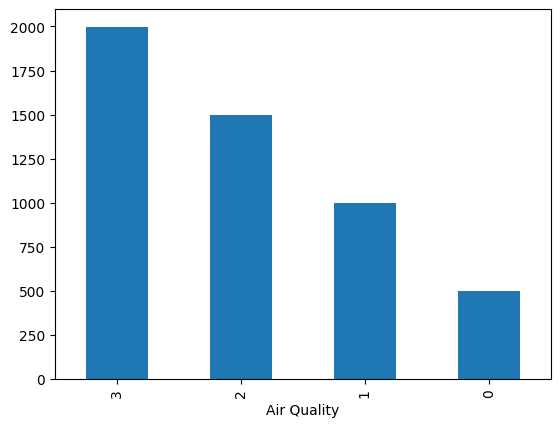

In [55]:
df["Air Quality"].value_counts().plot(kind="bar")

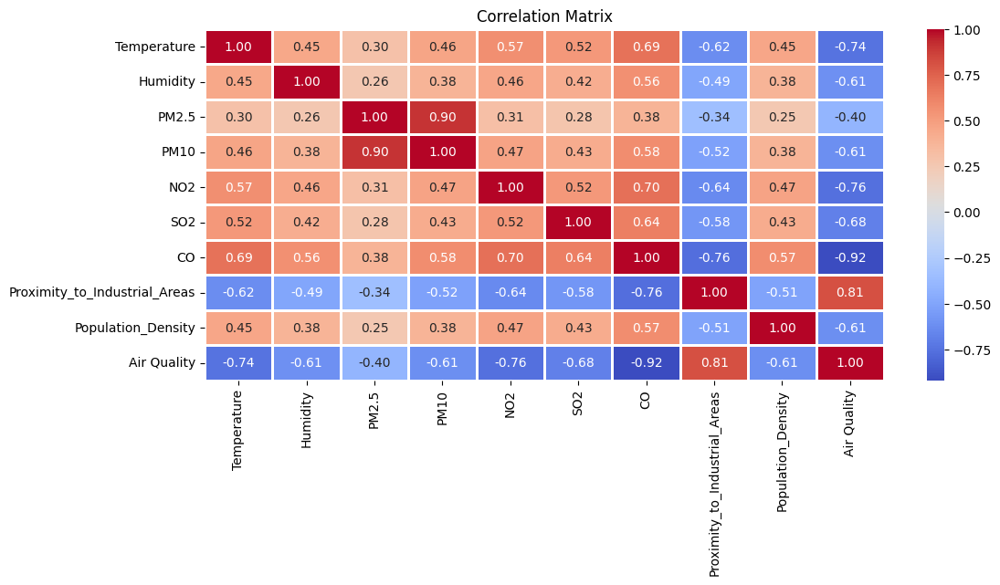

In [56]:
corr = df.corr(method="pearson")

plt.figure(figsize=(12, 5))

sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=2)

plt.title("Correlation Matrix")

plt.show()

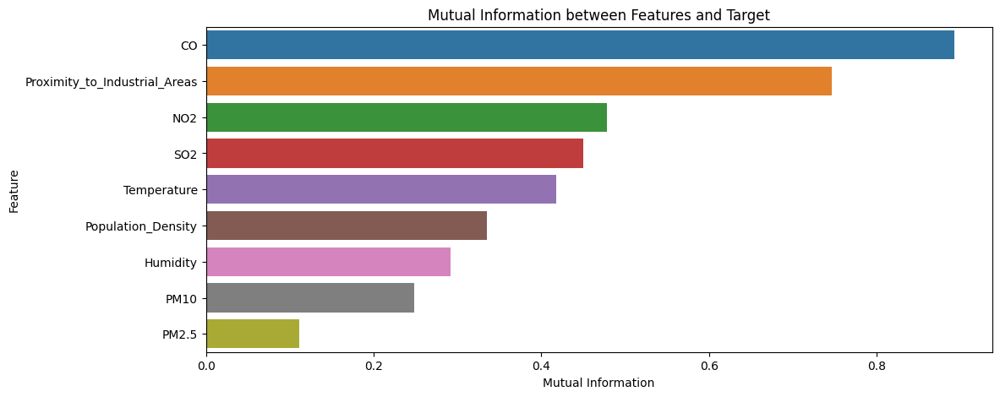

In [57]:
from sklearn.feature_selection import mutual_info_classif

X = df.drop("Air Quality", axis=1)
y = df["Air Quality"]

mutual_info = mutual_info_classif(X, y)

mutual_info_df = pd.DataFrame(list(zip(X.columns, mutual_info)), columns=["Feature", "Mutual Info"])

mutual_info_df = mutual_info_df.sort_values(by="Mutual Info", ascending=False)

plt.figure(figsize=(12, 5))

sns.barplot(x=mutual_info_df["Mutual Info"], y=mutual_info_df["Feature"], orient="h")

plt.title("Mutual Information between Features and Target")
plt.xlabel("Mutual Information")
plt.ylabel("Feature")

plt.show()

# Train-Test

In [58]:
y=df["Air Quality"]
x=df.drop("Air Quality", axis=1)

In [59]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [60]:
scaler = StandardScaler()

# Standard Scaler

In [61]:
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [62]:
df.head(3)

,Temperature,Humidity,PM2.5,PM10,NO2,SO2,CO,Proximity_to_Industrial_Areas,Population_Density,Air Quality
0,3.427515,4.096010,1.824549,2.939162,2.990720,2.322388,1.000632,1.987874,5.768321,2
1,3.377588,4.338597,1.193922,2.580217,3.459466,2.370244,0.970779,1.945910,6.416732,2
2,3.182212,4.326778,3.321432,3.549617,3.234749,2.610070,0.966984,1.824549,6.429719,2


# Random Forest

In [63]:
clf = RandomForestClassifier(random_state=42)
clf.fit(x_train_scaled, y_train)

RandomForestClassifier(random_state=42)

# Predict

In [64]:
y_pred = clf.predict(x_test_scaled)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.85      0.89       169
           1       0.86      0.91      0.89       317
           2       0.97      0.96      0.96       489
           3       1.00      1.00      1.00       675

    accuracy                           0.96      1650
   macro avg       0.94      0.93      0.93      1650
weighted avg       0.96      0.96      0.96      1650



In [65]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.96

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       169
           1       0.86      0.91      0.89       317
           2       0.97      0.96      0.96       489
           3       1.00      1.00      1.00       675

    accuracy                           0.96      1650
   macro avg       0.94      0.93      0.93      1650
weighted avg       0.96      0.96      0.96      1650



# Data Visualization

In [66]:
import warnings
warnings.filterwarnings('ignore')

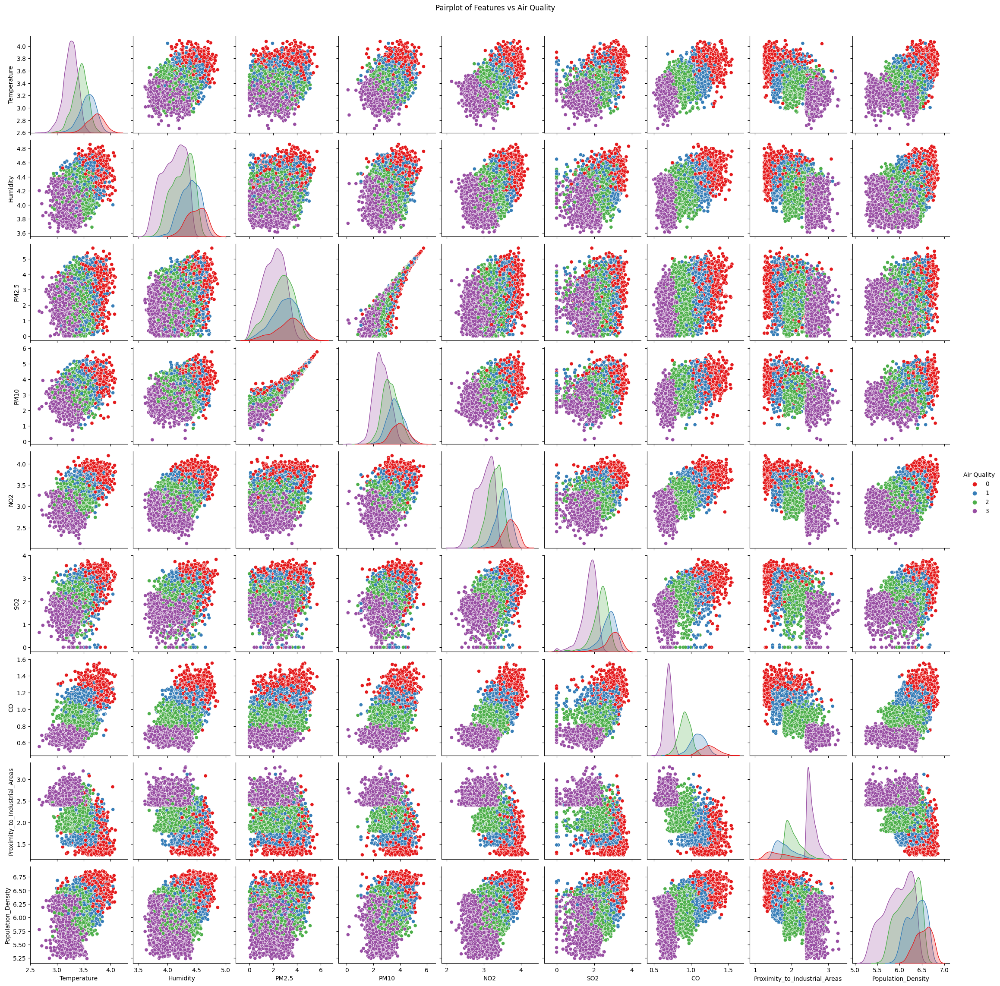

In [67]:
sns.pairplot(df, hue='Air Quality', palette='Set1', diag_kind='kde')
plt.suptitle('Pairplot of Features vs Air Quality', y=1.02)
plt.show()


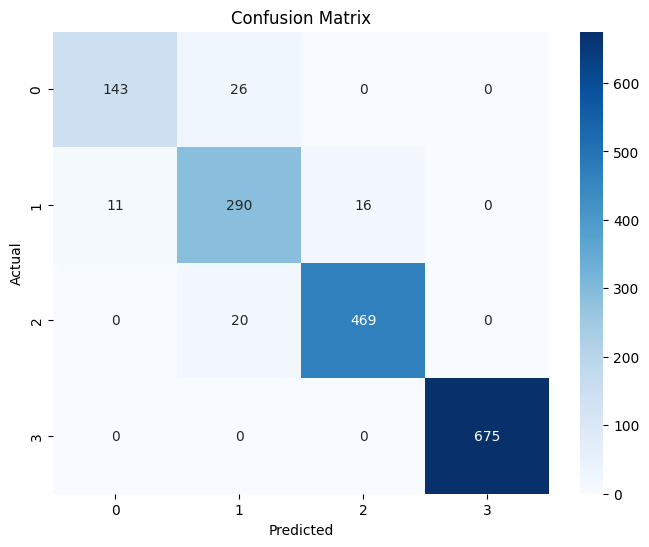

In [68]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()